In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pandas_profiling


In [2]:
credit=pd.read_excel('E:/Dsc_analytixlabs/ML/Case_study/Data Set.xlsx')
credit.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,owncd,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03
0,3964-QJWTRG-NPN,1,2.0,1,20,2,September,15,3,1,...,0,0,0,1,1,0,0,0,1,0
1,0648-AIPJSP-UVM,5,5.0,0,22,2,May,17,4,2,...,1,1,1,1,1,1,1,0,0,0
2,5195-TLUDJE-HVO,3,4.0,1,67,6,June,14,2,2,...,1,0,0,0,0,0,1,0,0,0
3,4459-VLPQUH-3OL,4,3.0,0,23,2,May,16,3,2,...,1,0,1,1,1,0,1,1,0,0
4,8158-SMTQFB-CNO,2,2.0,0,26,3,July,16,3,2,...,1,0,1,0,1,0,0,0,1,0


In [3]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 130 entries, custid to response_03
dtypes: float64(31), int64(97), object(2)
memory usage: 5.0+ MB


In [4]:
report = pandas_profiling.ProfileReport(credit)
report

Number of variables,130
Number of observations,5000
Total Missing (%),0.2%
Total size in memory,5.0 MiB
Average record size in memory,1.0 KiB
Numeric,59
Categorical,1
Boolean,49
Date,0
Text (Unique),1
Rejected,20


In [5]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')
# Settings
sns.set(style="darkgrid")
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

In [6]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 130 entries, custid to response_03
dtypes: float64(31), int64(97), object(2)
memory usage: 5.0+ MB


#### Creating UDFs

In [7]:
# Create Data audit Report for continuous variables
def continuous_var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  
                      x.std(), x.var(), x.min(), x.quantile(0.01), x.quantile(0.05),
                          x.quantile(0.10),x.quantile(0.25),x.quantile(0.50),x.quantile(0.75), 
                              x.quantile(0.90),x.quantile(0.95), x.quantile(0.99),x.max()], 
                  index = ['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1', 
                               'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

In [8]:
# Create Data audit Report for categorical variables
def categorical_var_summary(x):
    Mode = x.value_counts().sort_values(ascending = False)[0:1].reset_index()
    return pd.Series([x.count(), x.isnull().sum(), Mode.iloc[0, 0], Mode.iloc[0, 1], 
                          round(Mode.iloc[0, 1] * 100/x.count(), 2)], 
                  index = ['N', 'NMISS', 'MODE', 'FREQ', 'PERCENT'])

In [9]:
# Missing value imputation for categorical and continuous variables
def missing_imputation(x, stats = 'mean'):
    if (x.dtypes == 'float64') | (x.dtypes == 'int64'):
        x = x.fillna(x.mean()) if stats == 'mean' else x.fillna(x.median())
    else:
        x = x.fillna(x.mode()[0])
    return x

In [10]:
def create_dummies(df, colname):
    col_dummies = pd.get_dummies(df[colname], prefix = colname, drop_first = True)
    df = pd.concat([df, col_dummies], axis = 1)
    df.drop(colname, axis = 1, inplace = True )
    return df

#### Data Cleaning

In [11]:
# exclude these variables as they are too general
credit.drop(columns=['custid','birthmonth'],inplace=True)

In [12]:
credit.isnull().sum().sort_values(ascending=False)

lnwireten            3656
lnwiremon            3656
lnequipmon           3296
lnequipten           3296
lntollmon            2622
lntollten            2622
lncardten            1422
lncardmon            1419
lnlongten               3
longten                 3
cardten                 2
commutetime             2
townsize                2
lncreddebt              1
lnothdebt               1
cars                    0
homeown                 0
pets_freshfish          0
hometype                0
address                 0
pets_saltfish           0
addresscat              0
response_03             0
carown                  0
commutemotorcycle       0
commutewalk             0
commutebike             0
commutepublic           0
commuterail             0
commutebus              0
                     ... 
equipten                0
equipmon                0
equip                   0
tollten                 0
polparty                0
polcontrib              0
vote                    0
response_02 

In [13]:
# dropping variables having large number of missing values i.e. having missing values greater than 25%

In [14]:
credit.drop(columns=['lnwiremon','lnwireten','lnequipten','lnequipmon','lntollten','lntollmon','lncardten','lncardmon'],inplace=True)

In [15]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 120 entries, region to response_03
dtypes: float64(23), int64(97)
memory usage: 4.6 MB


In [16]:
# Categorical List= Contains categorical variables..
cat_vars=['region','townsize','gender','agecat','edcat','jobcat','union','empcat','retire','inccat',
         'default','jobsat','marital','spousedcat','homeown','hometype','addresscat','cars','carown','cartype',
         'carcatvalue','carbought','carbuy','commute','commutecat','commutecar','commutemotorcycle','commutecarpool',
         'commutebus','commuterail','commutepublic','commutebike','commutewalk','commutenonmotor','telecommute','reason',
         'polview','polparty','polcontrib','vote','card','cardtype','cardbenefit','cardfee','cardtenurecat',
         'card2','card2type','card2benefit','card2fee','card2tenurecat','active','bfast','churn','tollfree',
         'equip','callcard','wireless','multline','voice','pager','internet','callid','callwait','forward','confer','ebill',
         'owntv','ownvcr','owndvd','owncd','ownpda','ownpc','ownipod','owngame','ownfax','news','response_01','response_02',
         'response_03']
for x in cat_vars:
    credit[x] = credit[x].astype('object')

From the above profile report, we found that these variables are highly correlated...

-addresscat is highly correlated with address (ρ = 0.92352) Rejected
-agecat is highly correlated with age (ρ = 0.96988) Rejected
-card2tenure is highly correlated with cardtenure (ρ = 0.96298) Rejected
-card2tenurecat is highly correlated with card2tenure (ρ = 0.92439) Rejected
-commutecat is highly correlated with commute (ρ = 0.98117) Rejected
-edcat is highly correlated with ed (ρ = 0.9639) Rejected
-equipmon is highly correlated with equip (ρ = 0.94719) Rejected
-inccat is highly correlated with lninc (ρ = 0.95154) Rejected
-lnlongten is highly correlated with lnlongmon (ρ = 0.92147) Rejected
-longten is highly correlated with longmon (ρ = 0.98281) Rejected
-spoused is highly correlated with marital (ρ = 0.95577) Rejected
-spousedcat is highly correlated with spoused (ρ = 0.98403) Rejected
-tenure is highly correlated with card2tenure (ρ = 0.92824) Rejected

So we will drop these variables

- ['address','age','card2tenure','commute','ed','equipmon','inccat','lnlongten','longmon'
        'longten', 'spoused','spousedcat','cardtenure']

In [17]:
credit['total_spent']=credit.cardspent+credit.card2spent
credit.shape

(5000, 121)

In [18]:
credit.drop(columns=['cardspent','card2spent'],inplace=True)
credit.shape

(5000, 119)

In [19]:
credit.drop(columns=['address','age','card2tenure','cardtenure','commute','ed','equipmon','inccat','lnlongten',
  'longten','longmon', 'spoused','spousedcat','card2tenurecat'],inplace=True)

In [20]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 105 entries, region to total_spent
dtypes: float64(17), int64(13), object(75)
memory usage: 4.0+ MB


In [21]:
cat_var = credit.select_dtypes(include = ['object'])
cat_var.shape

(5000, 75)

In [22]:
conti_var=credit.select_dtypes(['float64','int64'])
conti_var.shape

(5000, 30)

In [23]:
conti_var.apply(continuous_var_summary).T.sort_values('NMISS',ascending=False).head()

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
cardten,4998.0,2.0,3.600951e+06,720.478391,425.000000,922.225527,850499.921936,0.000000,0.000000,0.000000,0.000000,0.000000,425.000000,1080.000000,1871.500000,2455.750000,4011.200000,13705.000000
commutetime,4998.0,2.0,1.266770e+05,25.345538,25.000000,5.879149,34.564390,8.000000,13.000000,16.000000,18.000000,21.000000,25.000000,29.000000,33.000000,35.000000,40.030000,48.000000
lncreddebt,4999.0,1.0,-6.521372e+02,-0.130454,-0.076106,1.273058,1.620678,-6.597334,-3.401690,-2.291604,-1.737842,-0.952685,-0.076106,0.724665,1.458625,1.852297,2.658910,4.692014
lnothdebt,4999.0,1.0,3.483879e+03,0.696915,0.741537,1.128578,1.273689,-4.092107,-2.168241,-1.243483,-0.780312,-0.018987,0.741537,1.462053,2.087178,2.469586,3.180802,4.952011
employ,5000.0,0.0,4.865200e+04,9.730400,7.000000,9.690929,93.914099,0.000000,0.000000,0.000000,0.000000,2.000000,7.000000,15.000000,25.000000,31.000000,39.000000,52.000000


In [24]:
# summary of categorical variables
cat_var.apply(categorical_var_summary).T.sort_values('NMISS',ascending=False).head(5)

,N,NMISS,MODE,FREQ,PERCENT
townsize,4998.0,2.0,1.0,1436.0,28.73
bfast,5000.0,0.0,3.0,1875.0,37.50
voice,5000.0,0.0,0.0,3485.0,69.70
multline,5000.0,0.0,0.0,2558.0,51.16
wireless,5000.0,0.0,0.0,3656.0,73.12


#### outlier treatment

In [25]:
conti_var= conti_var.apply(lambda x: x.clip(lower = x.quantile(0.01), upper = x.quantile(0.99)))

In [26]:
conti_var.apply(continuous_var_summary).round(2).T.head(20)

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
employ,5000.0,0.0,48490.00,9.70,7.00,9.58,91.81,0.00,0.00,0.00,0.00,2.00,7.00,15.00,25.00,31.00,39.00,39.00
income,5000.0,0.0,268149.50,53.63,38.00,46.57,2168.55,9.00,9.00,13.00,16.00,24.00,38.00,67.00,109.10,147.00,272.00,272.01
lninc,5000.0,0.0,18485.25,3.70,3.64,0.74,0.55,2.20,2.20,2.56,2.77,3.18,3.64,4.20,4.69,4.99,5.61,5.61
debtinc,5000.0,0.0,49570.60,9.91,8.80,6.24,38.96,0.70,0.70,1.90,2.80,5.10,8.80,13.60,18.60,22.20,29.20,29.20
creddebt,5000.0,0.0,8791.84,1.76,0.93,2.38,5.67,0.03,0.03,0.10,0.18,0.39,0.93,2.06,4.30,6.37,14.28,14.28
lncreddebt,4999.0,1.0,-638.77,-0.13,-0.08,1.24,1.54,-3.40,-3.40,-2.29,-1.74,-0.95,-0.08,0.72,1.46,1.85,2.66,2.66
othdebt,5000.0,0.0,17612.53,3.52,2.10,4.22,17.82,0.11,0.11,0.29,0.46,0.98,2.10,4.31,8.06,11.82,24.06,24.06
lnothdebt,4999.0,1.0,3491.23,0.70,0.74,1.10,1.22,-2.17,-2.17,-1.24,-0.78,-0.02,0.74,1.46,2.09,2.47,3.18,3.18
reside,5000.0,0.0,10971.00,2.19,2.00,1.36,1.85,1.00,1.00,1.00,1.00,1.00,2.00,3.00,4.00,5.00,6.00,6.00
pets,5000.0,0.0,15246.00,3.05,2.00,3.35,11.23,0.00,0.00,0.00,0.00,0.00,2.00,5.00,8.00,10.00,13.00,13.00


#### Missing_values

In [27]:
#for categorical and continuous variables
conti_var = conti_var.apply(missing_imputation)
cat_var = cat_var.apply(missing_imputation)

In [28]:
conti_var.apply(continuous_var_summary).T.round(1)
cat_var.apply(categorical_var_summary).T.round(1)

,N,NMISS,MODE,FREQ,PERCENT
region,5000.0,0.0,5.0,1027.0,20.5
townsize,5000.0,0.0,1.0,1438.0,28.8
gender,5000.0,0.0,1.0,2518.0,50.4
agecat,5000.0,0.0,4.0,1222.0,24.4
edcat,5000.0,0.0,2.0,1567.0,31.3
jobcat,5000.0,0.0,2.0,1640.0,32.8
union,5000.0,0.0,0.0,4244.0,84.9
empcat,5000.0,0.0,2.0,1180.0,23.6
retire,5000.0,0.0,0.0,4262.0,85.2
default,5000.0,0.0,0.0,3829.0,76.6


### i will keep the log of (income,creddebt,othdebt) and remove the original ones as we will keep ln of total_spent to reduce skewness in the label


In [30]:
conti_var.shape

(5000, 27)

In [29]:
cat_var.carcatvalue.replace(-1,0,inplace=True)

In [30]:
cat_var.carcatvalue.value_counts()

1    2399
2    1267
3     837
0     497
Name: carcatvalue, dtype: int64

In [31]:
cat_var.drop(columns=['empcat'],inplace=True)

In [31]:
cat_var.columns

Index(['region', 'townsize', 'gender', 'agecat', 'edcat', 'jobcat', 'union',
       'empcat', 'retire', 'default', 'jobsat', 'marital', 'homeown',
       'hometype', 'addresscat', 'cars', 'carown', 'cartype', 'carcatvalue',
       'carbought', 'carbuy', 'commutecat', 'commutecar', 'commutemotorcycle',
       'commutecarpool', 'commutebus', 'commuterail', 'commutepublic',
       'commutebike', 'commutewalk', 'commutenonmotor', 'telecommute',
       'reason', 'polview', 'polparty', 'polcontrib', 'vote', 'card',
       'cardtype', 'cardbenefit', 'cardfee', 'cardtenurecat', 'card2',
       'card2type', 'card2benefit', 'card2fee', 'active', 'bfast', 'churn',
       'tollfree', 'equip', 'callcard', 'wireless', 'multline', 'voice',
       'pager', 'internet', 'callid', 'callwait', 'forward', 'confer', 'ebill',
       'owntv', 'ownvcr', 'owndvd', 'owncd', 'ownpda', 'ownpc', 'ownipod',
       'owngame', 'ownfax', 'news', 'response_01', 'response_02',
       'response_03'],
      dtype='object')

In [34]:
for c_feature in ['gender','jobcat','union','retire','default','marital','homeown','cars',
                  'carbought','commutecar','commutemotorcycle', 'commutecarpool', 'commutebus',
                  'commuterail','commutepublic', 'commutebike', 'commutewalk', 'commutenonmotor',
                  'telecommute','reason', 'active', 'bfast', 'churn','polparty', 'polcontrib', 'vote',
                  'card', 'cardtype', 'cardbenefit', 'cardfee', 'card2',
                  'card2type', 'card2benefit', 'card2fee','cartype','carown',
                  'tollfree', 'equip', 'callcard', 'wireless', 'multline', 'voice',
                  'pager', 'internet', 'callid', 'callwait', 'forward', 'confer', 'ebill',
                  'owntv', 'ownvcr', 'owndvd', 'owncd', 'ownpda', 'ownpc', 'ownipod',
                  'owngame', 'ownfax', 'news', 'response_01', 'response_02','response_03']:
    cat_var[c_feature] = cat_var[c_feature].astype('category')
    cat_var = create_dummies(cat_var, c_feature)
    

In [35]:
cat_var.head()

,region,townsize,agecat,edcat,empcat,jobsat,hometype,addresscat,carcatvalue,carbuy,...,owncd_1,ownpda_1,ownpc_1,ownipod_1,owngame_1,ownfax_1,news_1,response_01_1,response_02_1,response_03_1
0,1,2.0,2,3,1,1,2,1,1,0,...,0,0,0,1,1,0,0,0,1,0
1,5,5.0,2,4,1,1,3,1,1,0,...,1,1,1,1,1,1,1,0,0,0
2,3,4.0,6,2,5,4,1,5,1,1,...,1,0,0,0,0,0,1,0,0,0
3,4,3.0,2,3,1,2,3,2,1,1,...,1,0,1,1,1,0,1,1,0,0
4,2,2.0,3,3,1,1,2,2,1,1,...,1,0,1,0,1,0,0,0,1,0


## Final Data 

In [36]:
credit_cards = pd.concat([conti_var, cat_var], axis = 1)
credit_cards.head()

,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,lnothdebt,reside,pets,...,owncd_1,ownpda_1,ownpc_1,ownipod_1,owngame_1,ownfax_1,news_1,response_01_1,response_02_1,response_03_1
0,0,31.0,3.433987,11.1,1.200909,0.183079,2.240091,0.806516,3,0,...,0,0,0,1,1,0,0,0,1,0
1,0,15.0,2.708050,18.6,1.222020,0.200505,1.567980,0.449788,2,6,...,1,1,1,1,1,1,1,0,0,0
2,16,35.0,3.555348,9.9,0.928620,-0.074056,2.536380,0.930738,3,3,...,1,0,0,0,0,0,1,0,0,0
3,0,20.0,2.995732,5.7,0.033160,-3.401690,1.117200,0.110826,5,0,...,1,0,1,1,1,0,1,1,0,0
4,1,23.0,3.135494,1.7,0.214659,-1.538705,0.176341,-1.735336,4,0,...,1,0,1,0,1,0,0,0,1,0


In [37]:
credit_cards.shape

(5000, 140)

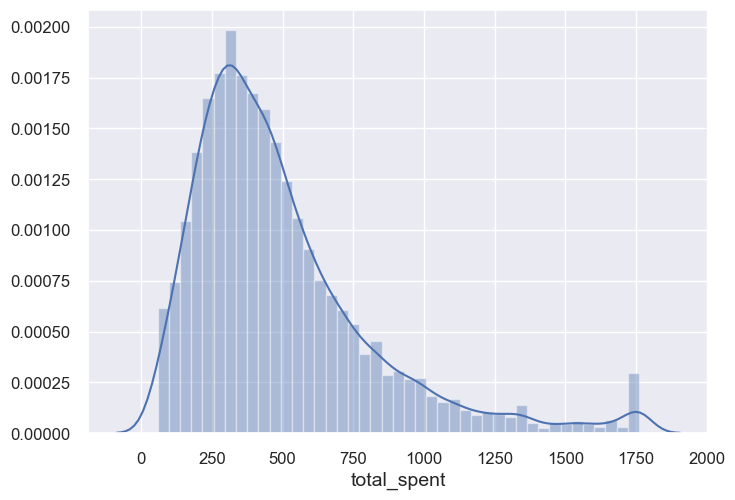

1.615173337243418

In [38]:
sns.distplot(credit_cards.total_spent)
plt.show()
credit_cards.total_spent.skew()

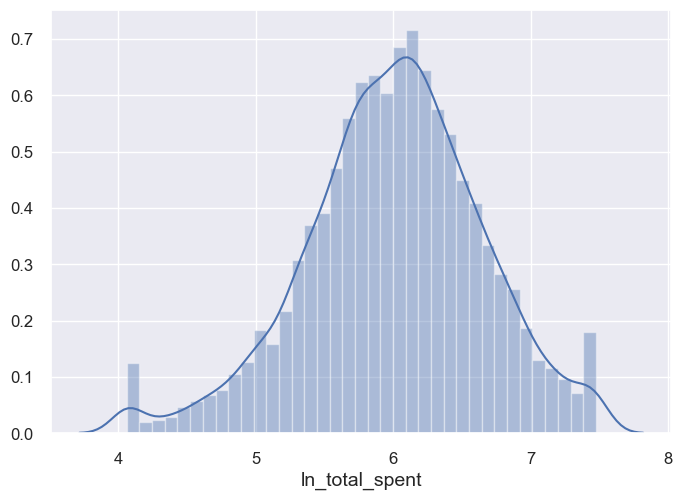

-0.30005358806310334

In [39]:
credit_cards['ln_total_spent']=np.log(credit_cards['total_spent'])
sns.distplot(credit_cards.ln_total_spent)
plt.show()
credit_cards['ln_total_spent'].skew()

In [40]:
credit_cards.drop('total_spent',axis=1,inplace=True)


In [41]:
corrm=credit_cards.corr()
corrm

,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,lnothdebt,reside,pets,...,ownpda_1,ownpc_1,ownipod_1,owngame_1,ownfax_1,news_1,response_01_1,response_02_1,response_03_1,ln_total_spent
employ,1.000000,0.350449,0.267303,0.031801,0.225514,0.172639,0.249165,0.195591,-0.245573,0.024996,...,-0.069775,-0.162028,-0.198838,-0.218677,-0.040587,0.368778,0.039085,0.014410,-0.029312,0.069522
income,0.350449,1.000000,0.898172,0.011586,0.627578,0.531251,0.696227,0.597843,-0.073381,0.008424,...,0.145061,0.049270,0.032922,0.040452,0.149388,0.138730,-0.002440,0.062895,0.053011,0.355851
lninc,0.267303,0.898172,1.000000,0.013177,0.566972,0.583808,0.636798,0.666062,-0.057788,0.005846,...,0.155503,0.057608,0.061467,0.060089,0.146191,0.108047,-0.001206,0.061287,0.060666,0.404878
debtinc,0.031801,0.011586,0.013177,1.000000,0.462598,0.552941,0.526964,0.628006,-0.026233,-0.002531,...,0.000553,0.008897,0.014713,0.005524,0.003251,0.005278,0.006831,0.003684,0.019776,0.016104
creddebt,0.225514,0.627578,0.566972,0.462598,1.000000,0.774923,0.640411,0.558549,-0.051607,-0.009922,...,0.070977,0.027479,0.010801,0.008185,0.075815,0.084178,0.000131,0.029993,0.040907,0.233370
lncreddebt,0.172639,0.531251,0.583808,0.552941,0.774923,1.000000,0.556191,0.675488,-0.048184,-0.009826,...,0.093951,0.033832,0.043189,0.023395,0.072876,0.058396,-0.002961,0.025132,0.054076,0.252888
othdebt,0.249165,0.696227,0.636798,0.526964,0.640411,0.556191,1.000000,0.807236,-0.054565,0.011681,...,0.102339,0.039821,0.041213,0.032867,0.114452,0.103930,0.008472,0.052683,0.041894,0.260430
lnothdebt,0.195591,0.597843,0.666062,0.628006,0.558549,0.675488,0.807236,1.000000,-0.070194,0.007919,...,0.102535,0.044995,0.061158,0.043593,0.093820,0.076191,0.007010,0.049590,0.045314,0.273914
reside,-0.245573,-0.073381,-0.057788,-0.026233,-0.051607,-0.048184,-0.054565,-0.070194,1.000000,-0.016431,...,0.026699,0.019673,0.043141,0.059125,0.013950,-0.053231,0.007868,0.010913,0.012770,0.003824
pets,0.024996,0.008424,0.005846,-0.002531,-0.009922,-0.009826,0.011681,0.007919,-0.016431,1.000000,...,-0.000215,0.005489,0.012559,0.006478,0.019317,0.034519,0.007425,0.026829,0.016476,-0.004739


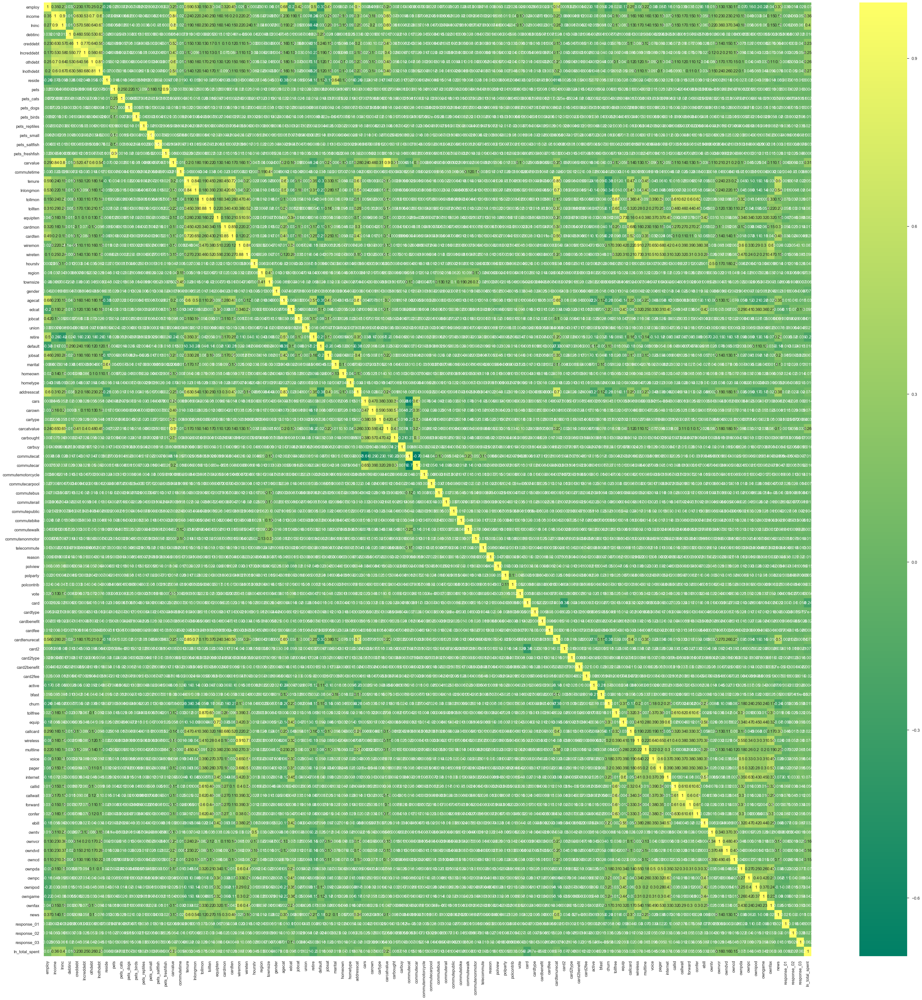

In [40]:
plt.figure(figsize=(50, 50))
corr=sns.heatmap(credit_cards.corr(), annot=True,cmap='summer')
corr
#corrm.to_csv('corrm.csv')

In [41]:
pandas_profiling.ProfileReport(credit_cards)

Number of variables,104
Number of observations,5000
Total Missing (%),0.0%
Total size in memory,4.0 MiB
Average record size in memory,832.0 B
Numeric,55
Categorical,0
Boolean,48
Date,0
Text (Unique),0
Rejected,1


In [42]:
credit_cards.drop(columns=['wireless_1'],inplace=True)

In [43]:
credit_cards.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 139 entries, employ to ln_total_spent
dtypes: float64(19), int64(24), uint8(96)
memory usage: 2.1 MB


### split the data for model building

In [44]:
# splitting the data: separate out the feature/input/independant columns and dependant variable
feature_columns = credit_cards.columns.difference(['ln_total_spent'])

In [45]:
from sklearn.model_selection import train_test_split

In [46]:
train, test = train_test_split(credit_cards, test_size = 0.3, random_state = 123)

In [47]:
# verify the no of obs in training and testing after split
print('No of obs in training: ', len(train), ' | ', 'No of obs in testing: ', len(test))

No of obs in training:  3500  |  No of obs in testing:  1500


In [48]:
all_columns='+'.join(feature_columns)
all_columns

'active_1+addresscat+agecat+bfast_2+bfast_3+callcard_1+callid_1+callwait_1+carbought_0+carbought_1+carbuy+carcatvalue+card2_2+card2_3+card2_4+card2_5+card2benefit_2+card2benefit_3+card2benefit_4+card2fee_1+card2type_2+card2type_3+card2type_4+card_2+card_3+card_4+card_5+cardbenefit_2+cardbenefit_3+cardbenefit_4+cardfee_1+cardmon+cardten+cardtenurecat+cardtype_2+cardtype_3+cardtype_4+carown_0+carown_1+cars_1+cars_2+cars_3+cars_4+cars_5+cars_6+cars_7+cars_8+cartype_0+cartype_1+carvalue+churn_1+commutebike_1+commutebus_1+commutecar_1+commutecarpool_1+commutecat+commutemotorcycle_1+commutenonmotor_1+commutepublic_1+commuterail_1+commutetime+commutewalk_1+confer_1+creddebt+debtinc+default_1+ebill_1+edcat+empcat+employ+equip_1+equipten+forward_1+gender_1+homeown_1+hometype+hourstv+income+internet_1+internet_2+internet_3+internet_4+jobcat_2+jobcat_3+jobcat_4+jobcat_5+jobcat_6+jobsat+lncreddebt+lninc+lnlongmon+lnothdebt+marital_1+multline_1+news_1+othdebt+owncd_1+owndvd_1+ownfax_1+owngame_1+own

## OLS Model 1

In [49]:
import statsmodels.formula.api as smf
from sklearn.metrics import mean_squared_error,mean_absolute_error

In [51]:
import statsmodels.formula.api as smf                # #simultaneously reducing least contributing variables as per p value

lm=smf.ols('''ln_total_spent ~bfast_2+carbuy+card2_2+card2_3+card2_4+card2_5+card2benefit_3
+card_2+card_3+card_4+card_5+cardmon+cardten+cardtenurecat+cartype_1+carvalue+commutebike_1+commutecarpool_1+ebill_1+edcat+equip_1+equipten
+gender_1+internet_3+internet_4+jobcat_5+jobcat_6+jobsat+lncreddebt+lninc+news_1+owndvd_1
+pets_reptiles+pets_saltfish+pets_small+
+reason_2+reason_9+region+response_02_1+union_1+voice_1''',train).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         ln_total_spent   R-squared:                       0.361
Model:                            OLS   Adj. R-squared:                  0.354
Method:                 Least Squares   F-statistic:                     47.67
Date:                Fri, 11 Jun 2021   Prob (F-statistic):          2.56e-300
Time:                        00:36:17   Log-Likelihood:                -2708.0
No. Observations:                3500   AIC:                             5500.
Df Residuals:                    3458   BIC:                             5759.
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            5.5302      0.095     58.084      0.000       5.344       5.717
bfast_2             -0.0396      0.021     -1.874      0.061      -0.081       0.002
carbuy               0.0284      0.019      1.521      0.128      -0.008       0.065
card2_2             -0.3876      0.029    -13.233      0.000      -0.445      -0.330
card2_3             -0.3663      0.029    -12.600      0.000      -0.423      -0.309
card2_4             -0.4175      0.032    -13.066      0.000      -0.480      -0.355
card2_5             -0.2786      0.042     -6.644      0.000      -0.361      -0.196
card2benefit_3      -0.0498      0.021     -2.414      0.016      -0.090      -0.009
card_2              -0.5752      0.029    -19.554      0.000      -0.633      -0.518
card_3              -0.5971      0.029    -20.243      0.000      -0.655      -0.539
card_4              -0.6987      0.030    -23.141      0.000      -0.758      -0.640
card_5              -0.5260      0.049    -10.741      0.000      -0.622      -0.430
cardmon             -0.0024      0.001     -1.879      0.060      -0.005       0.000
cardten            4.43e-05   2.52e-05      1.759      0.079   -5.07e-06    9.37e-05
cardtenurecat       -0.0337      0.010     -3.395      0.001      -0.053      -0.014
cartype_1            0.0237      0.018      1.283      0.200      -0.013       0.060
carvalue            -0.0010      0.001     -1.272      0.203      -0.002       0.001
commutebike_1       -0.0403      0.028     -1.461      0.144      -0.094       0.014
commutecarpool_1     0.0362      0.020      1.792      0.073      -0.003       0.076
ebill_1             -0.0296      0.024     -1.213      0.225      -0.077       0.018
edcat               -0.0273      0.009     -3.020      0.003      -0.045      -0.010
equip_1             -0.0543      0.034     -1.584      0.113      -0.122       0.013
equipten          3.869e-05   1.74e-05      2.226      0.026    4.61e-06    7.28e-05
gender_1            -0.0423      0.018     -2.344      0.019      -0.078      -0.007
internet_3           0.1096      0.030      3.626      0.000       0.050       0.169
internet_4           0.1188      0.033      3.628      0.000       0.055       0.183
jobcat_5            -0.0873      0.032     -2.721      0.007      -0.150      -0.024
jobcat_6            -0.0432      0.027     -1.601      0.110      -0.096       0.010
jobsat              -0.0106      0.007     -1.447      0.148      -0.025       0.004
lncreddebt           0.0148      0.009      1.669      0.095      -0.003       0.032
lninc                0.3705      0.024     15.176      0.000       0.323       0.418
news_1               0.0290      0.021      1.357      0.175      -0.013       0.071
owndvd_1             0.0617      0.036      1.721      0.085      -0.009       0.132
pets_reptiles        0.

In [52]:
# predict the sales on the training data
train['pred_sales'] = np.exp(lm.predict(train))

In [53]:
# predict the sales on the testing/validation data
test['pred_sales'] = np.exp(lm.predict(test))

In [ ]:
MSE_train = mean_squared_error(train.ln_total_spend, train.pred_sales)
MSE_test = mean_squared_error(test.ln_total_spend, test.pred_sales)

# print the values of MSE for train and test
print('MSE of training data: ', MSE_train,  ' | ', 'MSE of testing data: ', MSE_test)

# print the values of RMSE for train and test
print('RMSE of training data: ', np.sqrt(MSE_train),  ' | ', 
                              'RMSE of testing data: ', np.sqrt(MSE_test))

### VIF (Variance Inflation Factor): Check the multicollinieirity for all the variables in the model

In [55]:
model_param='''ln_total_spent ~bfast_2+carbuy+card2_2+card2_3+card2_4+card2_5+card2benefit_3
+card_2+card_3+card_4+card_5+cardmon+cardten+cardtenurecat+cartype_1+carvalue+commutebike_1+commutecarpool_1+ebill_1+edcat+equip_1+equipten
+gender_1+internet_3+internet_4+jobcat_5+jobcat_6+jobsat+lncreddebt+lninc+news_1+owndvd_1
+pets_reptiles+pets_saltfish+pets_small+
+reason_2+reason_9+region+response_02_1+union_1+voice_1'''

In [56]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

In [57]:
# separate the Y and X variables
y, X = dmatrices(model_param, train, return_type = 'dataframe')

# For each X, calculate VIF and save in dataframe
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF Factor'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# display the output
vif.round(1)

,Features,VIF Factor
0,Intercept,113.9
1,bfast_2,1.2
2,carbuy,1.0
3,card2_2,2.1
4,card2_3,2.1
5,card2_4,2.2
6,card2_5,1.4
7,card2benefit_3,1.0
8,card_2,2.0
9,card_3,2.0


These varibales will be droped:  cardmon,cardten

In [58]:
 # create the 10 groups in the data
train['Deciles'] = pd.qcut(train['pred_sales'], 10, labels = False)
test['Deciles'] = pd.qcut(test['pred_sales'], 10, labels = False)

In [59]:
# Decile Analysis for test data
Predicted_avg = train.groupby('Deciles')[['ln_total_spent', 'pred_sales']].mean().reset_index()

In [60]:
Predicted_avg

,Deciles,ln_total_spent,pred_sales
0,0,5.364741,215.563548
1,1,5.607915,269.570323
2,2,5.712335,301.975969
3,3,5.795862,332.495854
4,4,5.884112,366.115102
5,5,6.018401,406.583582
6,6,6.122460,453.876996
7,7,6.263836,521.662434
8,8,6.417457,622.162691
9,9,6.739439,851.814115


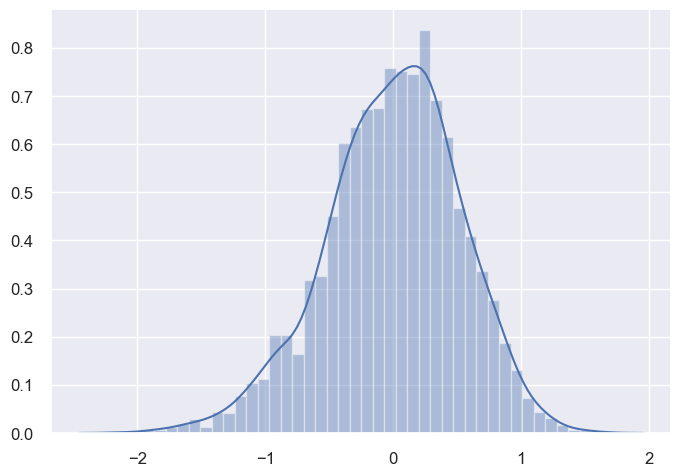

In [61]:
# assumption: Normality of the residuals/error (using distplot)
sns.distplot(lm.resid)
plt.show()

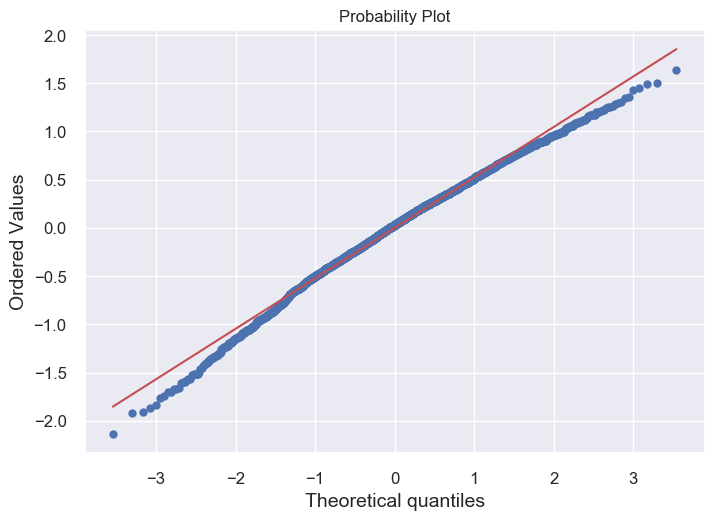

In [62]:
# assumption: Normality of the residuals/error (using Q-Q plot)
from scipy import stats
import pylab

stats.probplot(lm.resid, dist = 'norm', plot = pylab)
pylab.show()

## Model 2

In [67]:
lm_2=smf.ols('''ln_total_spent ~bfast_2+carbuy+card2_2+card2_3+card2_4+card2_5+card2benefit_3
+card_2+card_3+card_4+card_5+cardtenurecat+cartype_1+carvalue+commutebike_1+commutecarpool_1+ebill_1+edcat+equip_1+equipten
+gender_1+internet_3+internet_4+jobcat_5+jobcat_6+jobsat+lncreddebt+lninc+news_1+owndvd_1
+pets_reptiles+pets_saltfish+pets_small+
+reason_2+reason_9+region+response_02_1+union_1+voice_1''',train).fit()

In [68]:
lm_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         ln_total_spent   R-squared:                       0.360
Model:                            OLS   Adj. R-squared:                  0.353
Method:                 Least Squares   F-statistic:                     50.00
Date:                Fri, 11 Jun 2021   Prob (F-statistic):          3.04e-301
Time:                        00:55:51   Log-Likelihood:                -2709.8
No. Observations:                3500   AIC:                             5500.
Df Residuals:                    3460   BIC:                             5746.
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            5.5096      0.095     58.242      0.000       5.324       5.695
bfast_2             -0.0385      0.021     -1.824      0.068      -0.080       0.003
carbuy               0.0284      0.019      1.519      0.129      -0.008       0.065
card2_2             -0.3863      0.029    -13.192      0.000      -0.444      -0.329
card2_3             -0.3661      0.029    -12.592      0.000      -0.423      -0.309
card2_4             -0.4174      0.032    -13.060      0.000      -0.480      -0.355
card2_5             -0.2771      0.042     -6.610      0.000      -0.359      -0.195
card2benefit_3      -0.0504      0.021     -2.445      0.015      -0.091      -0.010
card_2              -0.5762      0.029    -19.590      0.000      -0.634      -0.519
card_3              -0.5973      0.029    -20.246      0.000      -0.655      -0.539
card_4              -0.6993      0.030    -23.164      0.000      -0.759      -0.640
card_5              -0.5249      0.049    -10.716      0.000      -0.621      -0.429
cardtenurecat       -0.0285      0.009     -3.104      0.002      -0.046      -0.010
cartype_1            0.0232      0.018      1.259      0.208      -0.013       0.059
carvalue            -0.0009      0.001     -1.242      0.214      -0.002       0.001
commutebike_1       -0.0407      0.028     -1.473      0.141      -0.095       0.013
commutecarpool_1     0.0368      0.020      1.820      0.069      -0.003       0.076
ebill_1             -0.0271      0.024     -1.113      0.266      -0.075       0.021
edcat               -0.0272      0.009     -3.011      0.003      -0.045      -0.010
equip_1             -0.0579      0.034     -1.700      0.089      -0.125       0.009
equipten          4.214e-05   1.71e-05      2.460      0.014    8.56e-06    7.57e-05
gender_1            -0.0414      0.018     -2.298      0.022      -0.077      -0.006
internet_3           0.1090      0.030      3.607      0.000       0.050       0.168
internet_4           0.1185      0.033      3.618      0.000       0.054       0.183
jobcat_5            -0.0856      0.032     -2.671      0.008      -0.148      -0.023
jobcat_6            -0.0409      0.027     -1.518      0.129      -0.094       0.012
jobsat              -0.0107      0.007     -1.454      0.146      -0.025       0.004
lncreddebt           0.0150      0.009      1.685      0.092      -0.002       0.032
lninc                0.3679      0.024     15.092      0.000       0.320       0.416
news_1               0.0342      0.021      1.640      0.101      -0.007       0.075
owndvd_1             0.0641      0.036      1.789      0.074      -0.006       0.134
pets_reptiles        0.0547      0.031      1.752      0.080      -0.007       0.116
pets_saltfish        0.0723      0.049      1.482      0.138      -0.023       0.168
pets_small          -0.

In [73]:
train['pred_sales'] = np.exp(lm_2.predict(train))

In [75]:
test['pred_sales'] = np.exp(lm_2.predict(test))

In [77]:
 # create the 10 groups in the data
train['Deciles'] = pd.qcut(train['pred_sales'], 10, labels = False)
test['Deciles'] = pd.qcut(test['pred_sales'], 10, labels = False)

In [78]:
# Decile Analysis for test data
Predicted_avg = train.groupby('Deciles')[['ln_total_spent', 'pred_sales']].mean().reset_index()

In [79]:
Predicted_avg

,Deciles,ln_total_spent,pred_sales
0,0,5.381635,215.468983
1,1,5.592124,269.684883
2,2,5.715306,302.225636
3,3,5.807662,332.602701
4,4,5.879094,366.130920
5,5,6.010492,406.456116
6,6,6.124295,454.258948
7,7,6.260906,522.333391
8,8,6.417661,620.511210
9,9,6.737384,851.295168


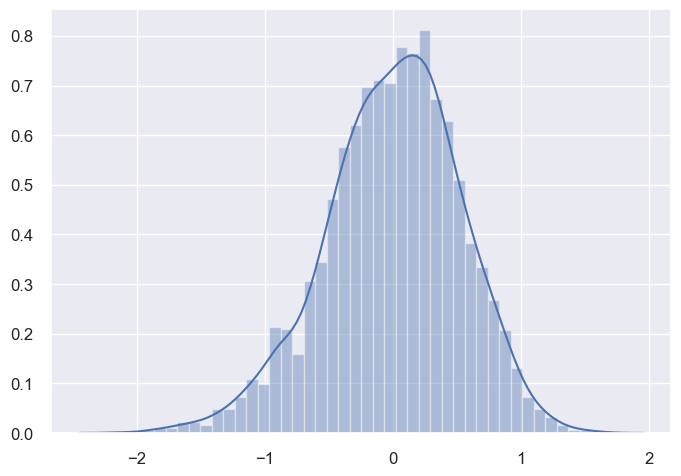

In [80]:
# assumption: Normality of the residuals/error (using distplot)
sns.distplot(lm_2.resid)
plt.show()

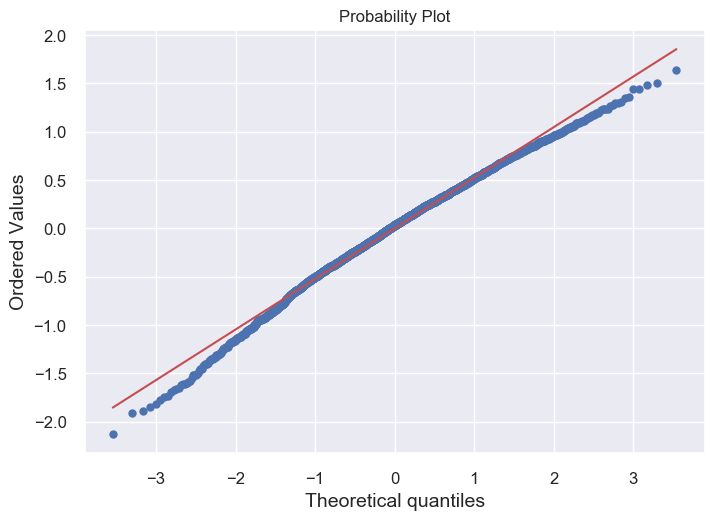

In [81]:
# assumption: Normality of the residuals/error (using Q-Q plot)
from scipy import stats
import pylab

stats.probplot(lm_2.resid, dist = 'norm', plot = pylab)
pylab.show()

In [82]:
lm_2.resid.shape

(3500,)

# Implementing ML model

In [72]:
features= credit_cards.columns.difference(['ln_total_spent'])

In [73]:
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.linear_model import LinearRegression 
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.ensemble import RandomForestRegressor

In [74]:
train_X,test_X,train_y,test_y=train_test_split(credit_cards[features],credit_cards['ln_total_spent'],test_size=0.3,random_state=123)

In [75]:
# verify the no of obs in training and testing after split
print('No of obs in training: ', len(train_X), ' | ', 'No of obs in testing: ', len(test_X))

No of obs in training:  3500  |  No of obs in testing:  1500


## Linear Regression

In [76]:
lr = LinearRegression()
sfs1 = sfs(lr, k_features=40, forward=False, verbose=1, scoring='neg_mean_squared_error')
sfs1 = sfs1.fit(credit_cards[features], credit_cards['ln_total_spent'])

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:   20.0s finished
Features: 128/40[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 128 out of 128 | elapsed:   19.0s finished
Features: 127/40[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 127 out of 127 | elapsed:   18.8s finished
Features: 126/40[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 126 out of 126 | elapsed:   18.7s finished
Features: 125/40[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 125 out of 125 | elapsed:   17.9s finished
Features: 124/40[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 124 out of 124 | elapsed:   17.2s finished
Features: 123/

[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:    6.7s finished
Features: 79/40[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  79 out of  79 | elapsed:    6.4s finished
Features: 78/40[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:    6.2s finished
Features: 77/40[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  77 out of  77 | elapsed:    5.9s finished
Features: 76/40[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  76 out of  76 | elapsed:    6.5s finished
Features: 75/40[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:    6.6s finished
Features: 74/40[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Par

In [77]:
feat_names = list(sfs1.k_feature_names_)
print(feat_names)

['addresscat', 'callcard_1', 'card2_2', 'card2_3', 'card2_4', 'card2_5', 'card2benefit_3', 'card_2', 'card_3', 'card_4', 'card_5', 'cardmon', 'cardten', 'cardtenurecat', 'cars_2', 'carvalue', 'churn_1', 'commutebus_1', 'default_1', 'ebill_1', 'edcat', 'equip_1', 'equipten', 'gender_1', 'internet_2', 'internet_3', 'internet_4', 'jobcat_4', 'jobcat_5', 'jobcat_6', 'lninc', 'owncd_1', 'owntv_1', 'pets_saltfish', 'polview', 'reason_2', 'reason_9', 'region', 'union_1', 'voice_1']


In [78]:
new_data = credit_cards[feat_names]
new_data['ln_total_spent'] = credit_cards['ln_total_spent']

In [79]:
new_data.shape

(5000, 41)

In [80]:
train_X,test_X,train_y,test_y=train_test_split(new_data[feat_names],new_data['ln_total_spent'],test_size=0.3,random_state=123)

In [81]:
lr= LinearRegression()
lr.fit(train_X,train_y)
y_predict=lr.predict(test_X)
r_squared = r2_score(test_y,y_predict)
print('The R-square value is: ', r_squared.round(4))
acc_linear=round( lr.score(test_X,test_y) * 100, 2)
print ('score:'+str(acc_linear) + ' percent')

The R-square value is:  0.3316
score:33.16 percent


In [82]:
acc_linear=round( lr.score(train_X, train_y) * 100, 2)
print ('score:'+str(acc_linear) + ' percent')

score:35.73 percent
